# Time Series Prediction Using LSTM

Data 출처 : ASHRAE - Great Energy Predictor III Competition from Kaggle (https://www.kaggle.com/c/ashrae-energy-prediction/data)

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [2]:
data_train = pd.read_csv("data/train.csv")
data_meta = pd.read_csv("data/building_metadata.csv")

In [3]:
mer_data = pd.merge(data_train, data_meta, on = 'building_id')
mer_data.timestamp = pd.to_datetime(mer_data['timestamp'])

In [4]:
mer_data = mer_data.set_index("timestamp")

In [5]:
mer_data.head()

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
timestamp,,,,,,,,
2016-01-01 00:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 01:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 02:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 03:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 04:00:00,0,0,0.0,0,Education,7432,2008.0,NaN


# EDA

#### site ID 별 meter reading 합

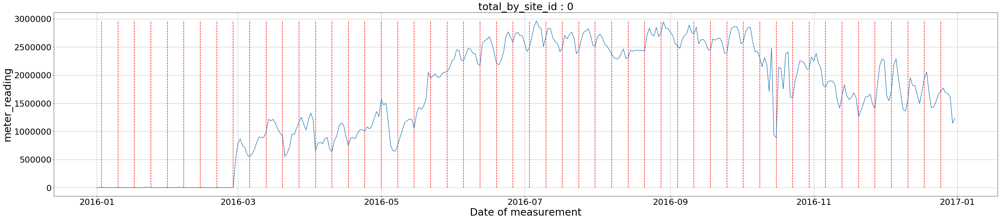

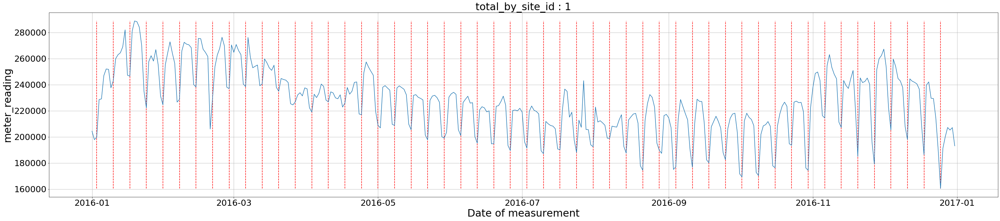

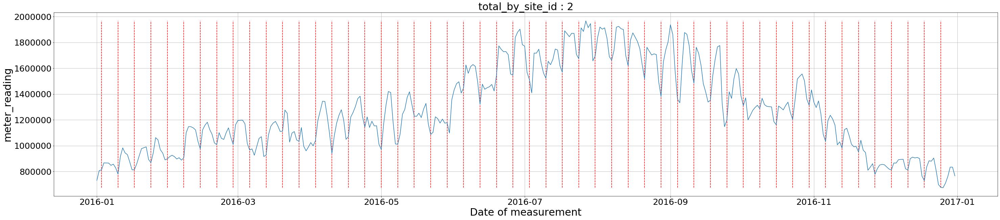

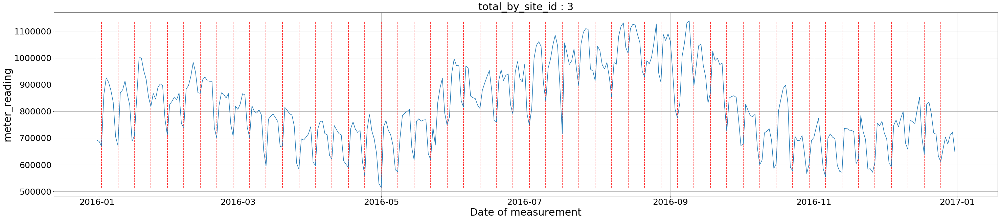

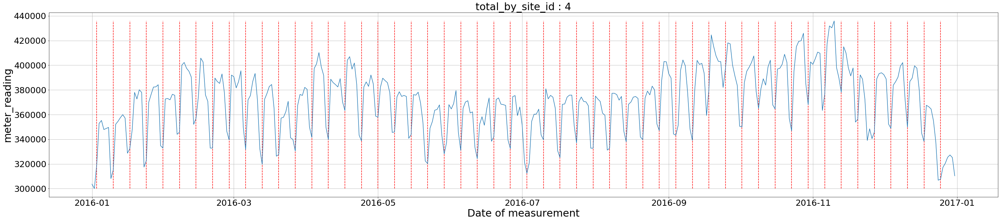

...

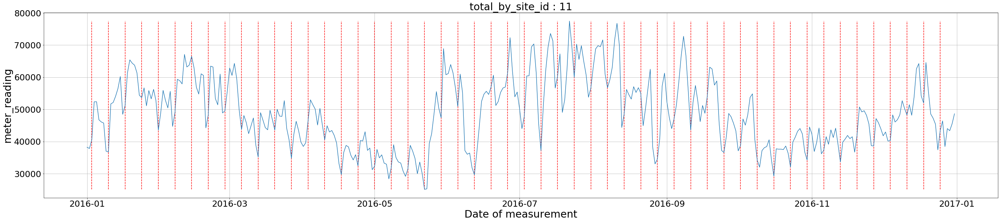

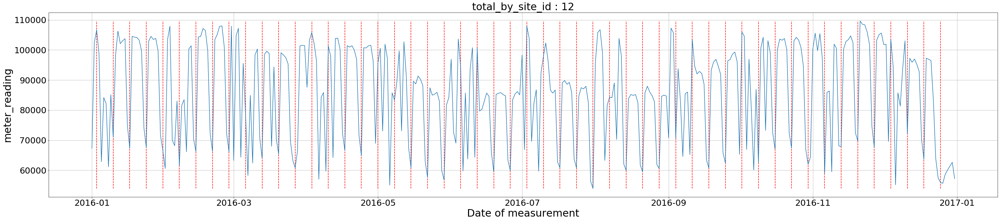

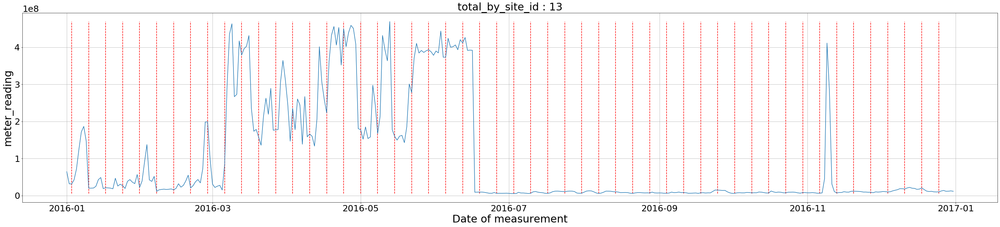

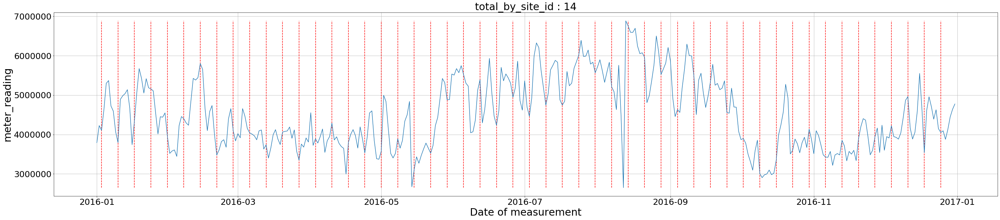

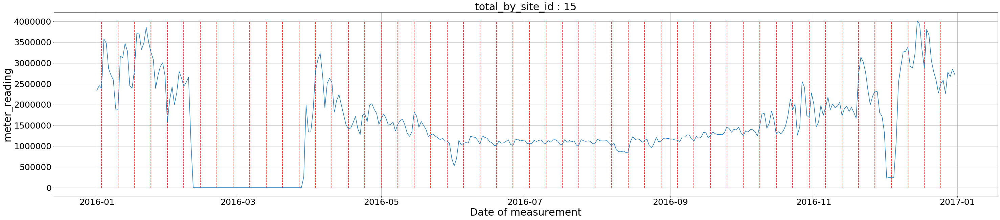

In [8]:
for j in range(16):
        fig = plt.figure(figsize=(50,10))
        plt.rc('xtick',labelsize=25)
        plt.rc('ytick',labelsize=25)
        plt.title('total_by_site_id : ' + str(j),fontsize=30)
        tmp = mer_data[(mer_data['site_id']==j)].resample("D").sum()
        plt.grid(True)
        plt.plot(tmp['meter_reading'])
        plt.vlines(pd.Series(pd.date_range(start='2016-01-01', end='2016-12-31', freq='W')), ymin=np.min(tmp['meter_reading']),ymax=np.max(tmp['meter_reading']), alpha = 1, colors = 'red', linestyles = 'dashed')
        plt.xlabel("Date of measurement",fontsize=30)
        plt.ylabel("meter_reading",fontsize=30)
        plt.show()

#### primary use 별 meter reading 합

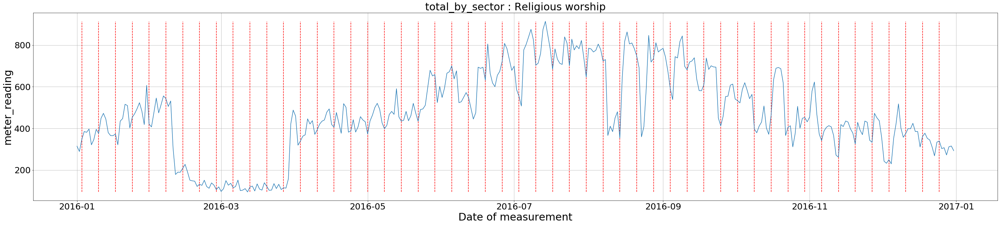

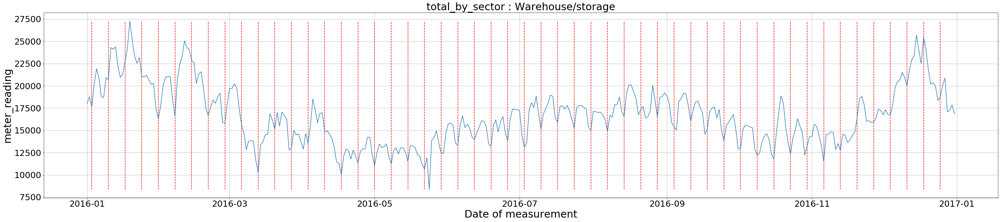

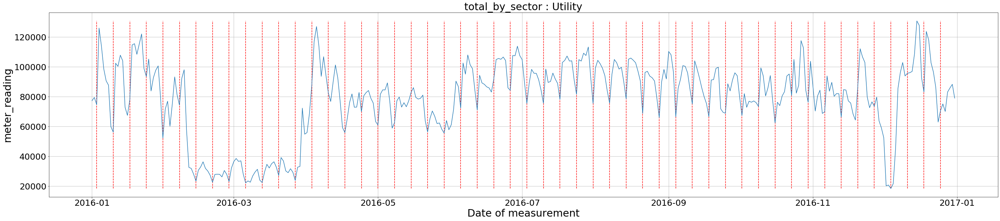

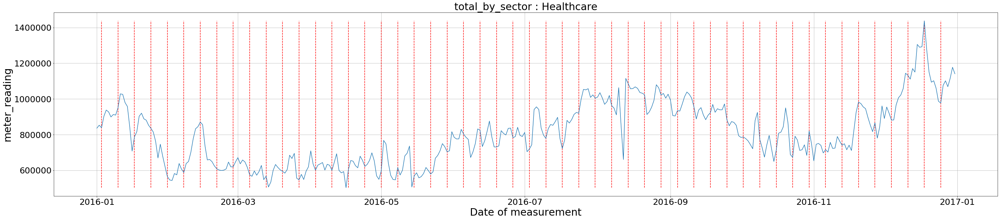

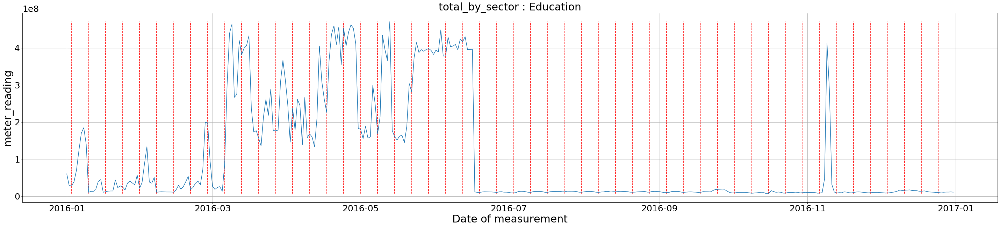

...

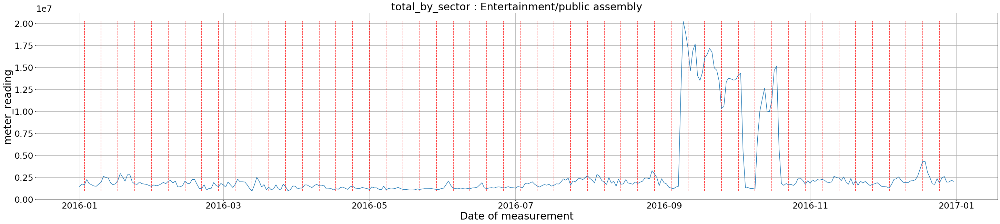

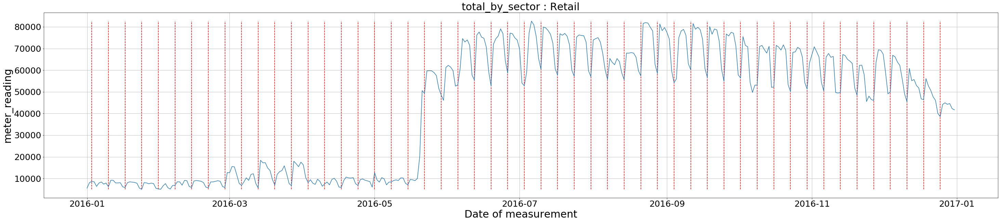

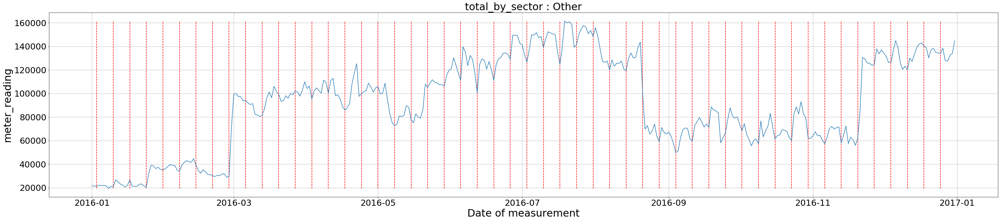

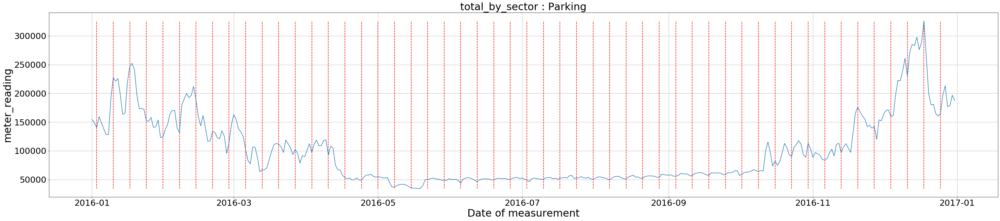

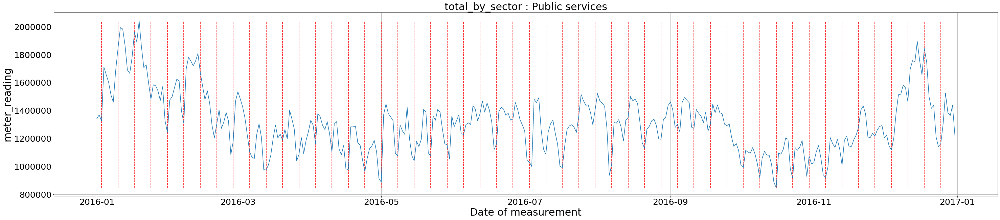

In [9]:
for i in set(mer_data['primary_use']):
    fig = plt.figure(figsize=(50,10))
    plt.rc('xtick',labelsize=25)
    plt.rc('ytick',labelsize=25)
    plt.title('total_by_sector : ' + i,fontsize=30)
    tmp =mer_data[(mer_data['primary_use']==i)].resample("D").sum()
    plt.grid(True)
    plt.plot(tmp['meter_reading']) 
    plt.vlines(pd.Series(pd.date_range(start='2016-01-01', end='2016-12-31', freq='W')), ymin=np.min(tmp['meter_reading']),ymax=np.max(tmp['meter_reading']), alpha = 1, colors = 'red', linestyles = 'dashed') 
    plt.xlabel("Date of measurement",fontsize=30)
    plt.ylabel("meter_reading",fontsize=30)
    plt.savefig('Vtotal_'+ str(i).replace('/','_',1))
    plt.show()

#### site ID 내 primary use 별 일 평균 meter reading

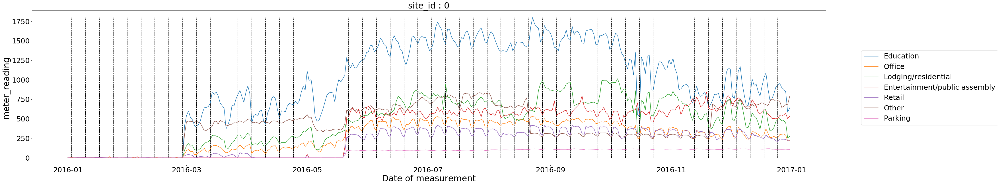

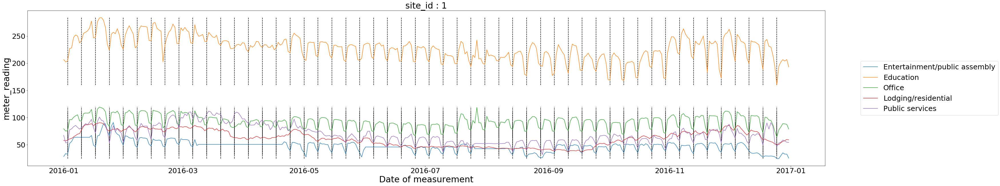

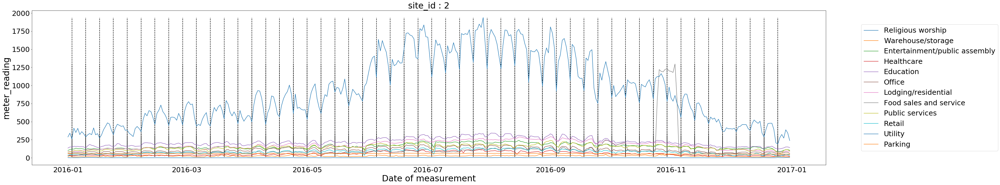

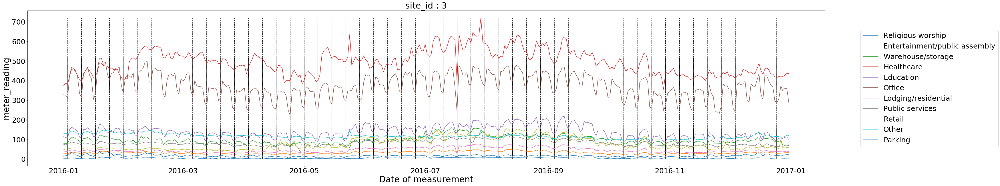

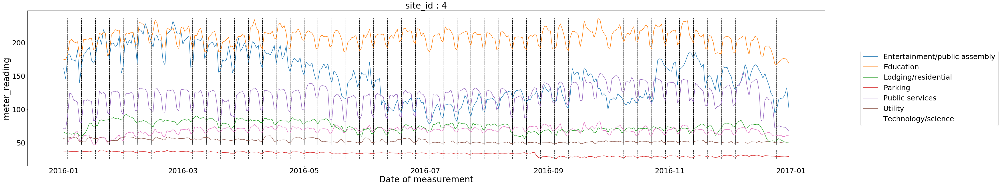

...

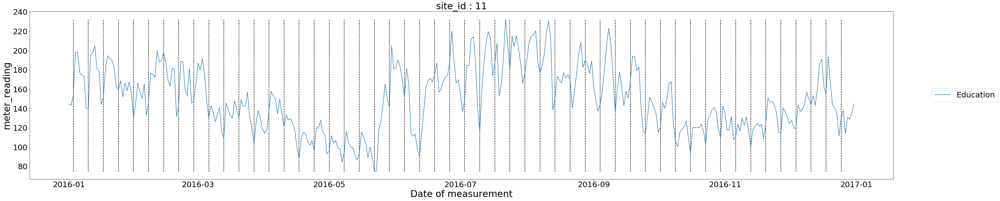

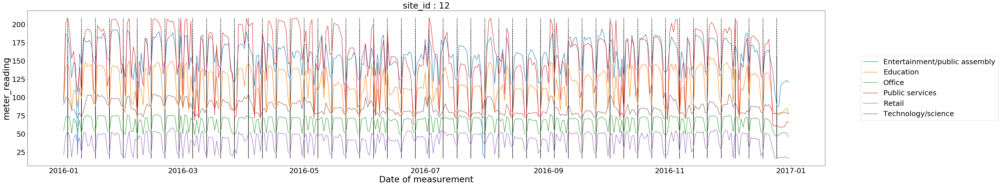

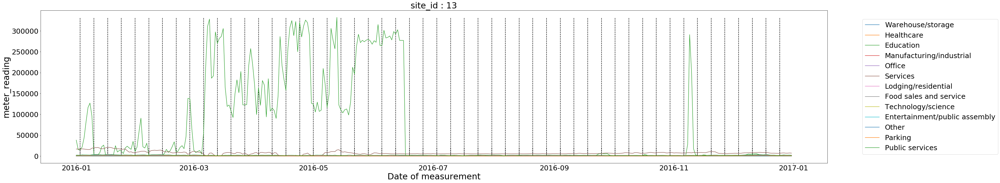

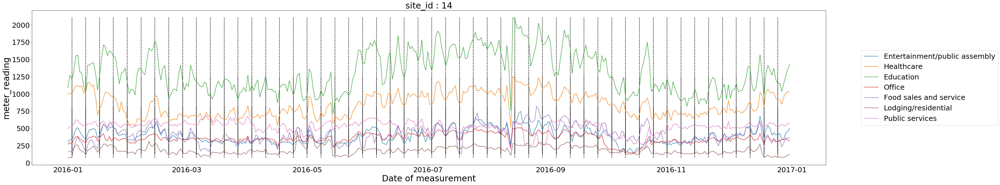

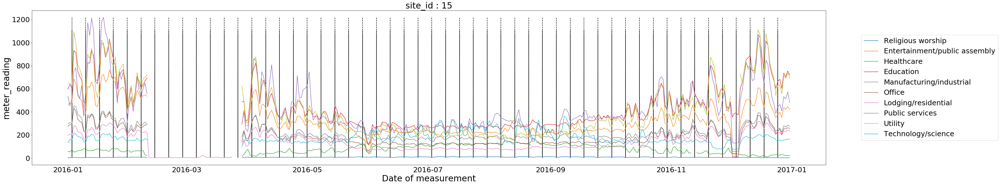

In [10]:
for j in range(16):
    fig = plt.figure(figsize=(50,10))
    for i in set(mer_data[mer_data['site_id']==j]['primary_use']):        
        plt.rc('xtick',labelsize=25)
        plt.rc('ytick',labelsize=25)
        plt.title('site_id : ' + str(j), fontsize=30)
        tmp=mer_data[(mer_data['site_id']==j)&(mer_data['primary_use']==i)].resample("D").mean()
        plt.plot(tmp['meter_reading'])
        plt.vlines(pd.Series(pd.date_range(start='2016-01-01', end='2016-12-31', freq='W')), ymin=np.min(tmp['meter_reading']),ymax=np.max(tmp['meter_reading']), alpha = 1, colors = 'black', linestyles = 'dashed') 
        plt.xlabel("Date of measurement", fontsize=30)
        plt.ylabel("meter_reading", fontsize=30)
    plt.legend(set(mer_data[mer_data['site_id']==j]['primary_use']),
          bbox_to_anchor=(1.04,0.5),loc = "center left",fontsize=25)
    plt.show()

이 중 Site_ID 2의 Office building에 대해 분석해 보도록 한다.

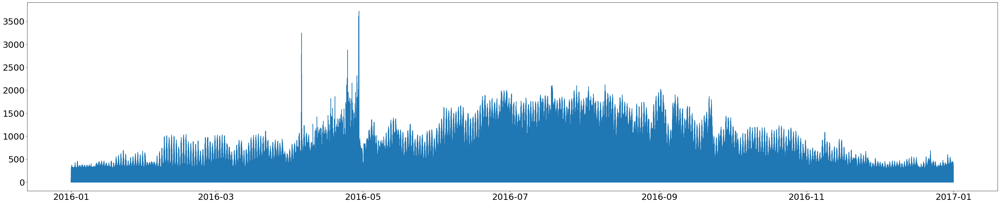

In [11]:
fig = plt.figure(figsize=(50,10))
tmp = mer_data[(mer_data['site_id']==2)&(mer_data['primary_use']=='Office')]
plt.plot(tmp['meter_reading'])

In [12]:
tmp.head()

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
timestamp,,,,,,,,
2016-01-01 00:00:00,157,0,28.10,2,Office,5258,NaN,NaN
2016-01-01 01:00:00,157,0,26.57,2,Office,5258,NaN,NaN
2016-01-01 02:00:00,157,0,25.73,2,Office,5258,NaN,NaN
2016-01-01 03:00:00,157,0,25.96,2,Office,5258,NaN,NaN
2016-01-01 04:00:00,157,0,25.59,2,Office,5258,NaN,NaN


1시간 단위로 평균낸다.

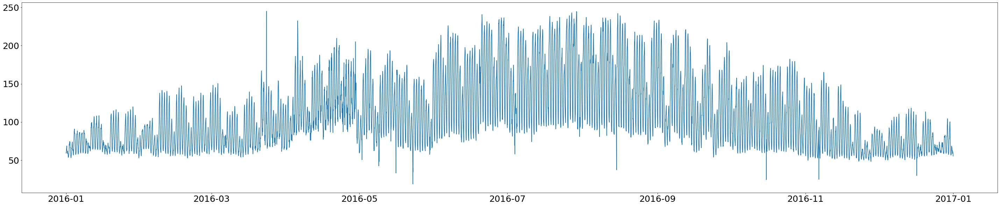

In [13]:
fig = plt.figure(figsize=(50,10))
a=tmp.resample("60T").mean()
plt.plot(a['meter_reading'])

In [14]:
a.to_csv("all.csv")

### Add Features (merge weather data)

In [15]:
train = pd.read_csv("all.csv")
w_train = pd.read_csv("data/weather_train.csv")
meta_building = pd.read_csv("data/building_metadata.csv")

In [16]:
train.head()

,timestamp,building_id,meter,meter_reading,site_id,square_feet,year_built,floor_count
0,2016-01-01 00:00:00,230.521739,0.73913,59.416239,2.0,81206.217391,1968.0625,NaN
1,2016-01-01 01:00:00,230.521739,0.73913,59.299878,2.0,81206.217391,1968.0625,NaN
2,2016-01-01 02:00:00,230.521739,0.73913,60.380122,2.0,81206.217391,1968.0625,NaN
3,2016-01-01 03:00:00,230.521739,0.73913,62.482302,2.0,81206.217391,1968.0625,NaN
4,2016-01-01 04:00:00,230.521739,0.73913,64.023207,2.0,81206.217391,1968.0625,NaN


In [17]:
weather = w_train[w_train['site_id'] == 2] #site 2의 날씨를 가져온다.

In [18]:
weather.isnull().sum() #NA값 확인

site_id                  0
timestamp                0
air_temperature          1
cloud_coverage        2354
dew_temperature          1
precip_depth_1_hr       66
sea_level_pressure      44
wind_direction         591
wind_speed               5
dtype: int64

In [19]:
weather.shape

(8783, 9)

In [20]:
#drop column with too many NAs
weather = weather.drop(columns = ['cloud_coverage'])

In [21]:
weather.isnull().sum()

site_id                 0
timestamp               0
air_temperature         1
dew_temperature         1
precip_depth_1_hr      66
sea_level_pressure     44
wind_direction        591
wind_speed              5
dtype: int64

In [22]:
weather = weather.fillna(method = "bfill") #뒤 값으로 채우기

In [23]:
weather.head()

,site_id,timestamp,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
17547,2,2016-01-01 00:00:00,15.6,-5.6,0.0,1015.3,270.0,3.6
17548,2,2016-01-01 01:00:00,13.9,-5.6,0.0,1015.6,270.0,4.1
17549,2,2016-01-01 02:00:00,13.3,-5.6,0.0,1016.0,270.0,3.1
17550,2,2016-01-01 03:00:00,12.2,-6.1,0.0,1016.6,280.0,3.1
17551,2,2016-01-01 04:00:00,11.7,-6.7,0.0,1017.0,270.0,3.1


In [24]:
weather = weather.set_index('timestamp')

In [25]:
train = train.set_index('timestamp')

In [26]:
weather.head()

,site_id,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,
2016-01-01 00:00:00,2,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,2,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,2,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,2,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,2,11.7,-6.7,0.0,1017.0,270.0,3.1


In [27]:
train.head()

,building_id,meter,meter_reading,site_id,square_feet,year_built,floor_count
timestamp,,,,,,,
2016-01-01 00:00:00,230.521739,0.73913,59.416239,2.0,81206.217391,1968.0625,NaN
2016-01-01 01:00:00,230.521739,0.73913,59.299878,2.0,81206.217391,1968.0625,NaN
2016-01-01 02:00:00,230.521739,0.73913,60.380122,2.0,81206.217391,1968.0625,NaN
2016-01-01 03:00:00,230.521739,0.73913,62.482302,2.0,81206.217391,1968.0625,NaN
2016-01-01 04:00:00,230.521739,0.73913,64.023207,2.0,81206.217391,1968.0625,NaN


In [28]:
s=pd.DataFrame(train['meter_reading'])
s.head()

,meter_reading
timestamp,
2016-01-01 00:00:00,59.416239
2016-01-01 01:00:00,59.299878
2016-01-01 02:00:00,60.380122
2016-01-01 03:00:00,62.482302
2016-01-01 04:00:00,64.023207


In [29]:
mer = pd.merge(s, weather, left_index = True, right_index = True ,how = 'left') #meter_Reading, weather와 merge

In [30]:
mer.head()

,meter_reading,site_id,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,,
2016-01-01 00:00:00,59.416239,2.0,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,59.299878,2.0,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,60.380122,2.0,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,62.482302,2.0,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,64.023207,2.0,11.7,-6.7,0.0,1017.0,270.0,3.1


In [31]:
mer.to_csv('mer_weather2.csv')

### Weather EDA
used https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/

In [32]:
mer=pd.read_csv('mer_weather2.csv')

In [33]:
dataset=mer.drop(['site_id'], axis=1)

In [34]:
dataset=dataset.set_index('timestamp')

In [35]:
dataset.head()

,meter_reading,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,
2016-01-01 00:00:00,59.416239,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,59.299878,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,60.380122,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,62.482302,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,64.023207,11.7,-6.7,0.0,1017.0,270.0,3.1


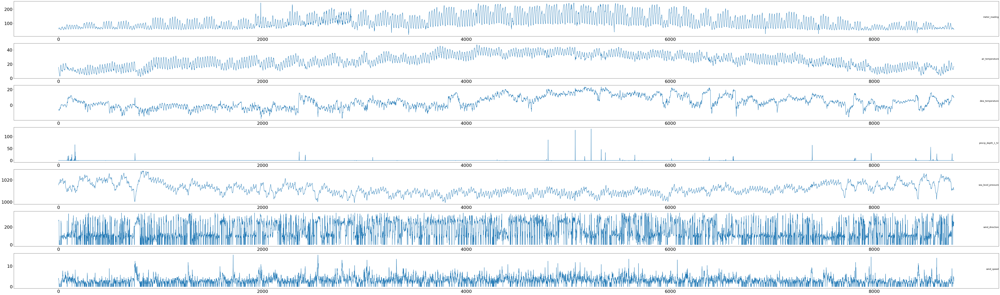

In [36]:
from matplotlib import pyplot
values = dataset.values
# specify columns to plot
groups = [0, 1, 2, 3, 4, 5, 6]
i = 1
# plot each column
pyplot.figure(figsize=(100,30))
for group in groups:
    pyplot.subplot(len(groups), 1, i)
    pyplot.plot(values[:, group])
    pyplot.title(dataset.columns[group], y=0.5, loc='right')
    i += 1
pyplot.show()

# LSTM Modeling

### Data Preprocessing

In [37]:
mer=pd.read_csv('mer_weather2.csv')

In [38]:
dataset=mer.drop(['site_id'], axis=1)

In [39]:
dataset=dataset.set_index('timestamp')

In [40]:
dataset.head()

,meter_reading,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,
2016-01-01 00:00:00,59.416239,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,59.299878,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,60.380122,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,62.482302,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,64.023207,11.7,-6.7,0.0,1017.0,270.0,3.1


In [41]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
import keras
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras import Sequential
import numpy as np
import math
from sklearn.metrics import mean_squared_error

Using TensorFlow backend.


In [42]:
#time series를 window size로 쪼개어 1 stride 씩 옮김 (1,2,3,4,5,6... / 2,3,4,5,6,7... / 3,4,5,6,7,8,...)
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    
    # set names of each column
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)] #var1 t-24, var2 t-24,.... var7 t-1
        
        
    # sequences to predict (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    
    # put lists of list together in one dataframe
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values (처음 24개줄)
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [43]:
values = dataset.values

values = values.astype('float32')# ensure all data is float

scaler = MinMaxScaler(feature_range=(0, 1)) # normalize each feature
scaled = scaler.fit_transform(values)
scaled

array([[0.17892712, 0.2977778 , 0.28641978, ..., 0.5536308 , 0.75      ,
        0.23376623],
       [0.17841256, 0.26      , 0.28641978, ..., 0.56401443, 0.75      ,
        0.26623377],
       [0.18318957, 0.24666667, 0.28641978, ..., 0.57785416, 0.75      ,
        0.2012987 ],
       ...,
       [0.18327081, 0.32222223, 0.65679014, ..., 0.41176605, 0.6666667 ,
        0.2987013 ],
       [0.1657243 , 0.32222223, 0.671605  , ..., 0.40484238, 0.6944445 ,
        0.23376623],
       [0.1613445 , 0.32222223, 0.671605  , ..., 0.40484238, 0.6944445 ,
        0.16883117]], dtype=float32)

### Hyperparameter Tuning

In [88]:
from keras.losses import mean_squared_error
from keras import backend as K

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(mean_squared_error(y_true, y_pred)) #rmse

In [89]:
def timeseries_lstm(window_size,num_layer,batch_size,epoch):

    window_size=window_size

    reframed = series_to_supervised(scaled, n_in=window_size, n_out=1) #window size 추출하고, 예측은 변수 1개(meter_reading)만 (var1(t)) 

    # drop weather columns - 예측안하니깐
    reframed.drop(reframed.columns[[-6,-5,-4,-3,-2,-1]], axis=1, inplace=True)

    #split train and test
    values = reframed.values
    n_test_hours = 31*24
    train = values[:-n_test_hours, :]
    test = values[-n_test_hours:, :] #마지막 31일을 test data로 한다.

    #split train into train & valid
    n_valid_hours = 60*24 #60일정도 validation set으로둔다.
    train = train[:-n_valid_hours, :]
    valid = train[-n_valid_hours:, :]


    train_X, train_y = train[:, :-1], train[:, -1]
    valid_X, valid_y = valid[:, :-1], valid[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]

    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], window_size, int(train_X.shape[1]/window_size)))
    valid_X = valid_X.reshape((valid_X.shape[0], window_size, int(valid_X.shape[1]/window_size)))
    test_X = test_X.reshape((test_X.shape[0], window_size, int(test_X.shape[1]/window_size)))

    # design model
    model = Sequential()
    for i in range(num_layer-1):
        model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss=root_mean_squared_error)
    
    #fit model
    history = model.fit(train_X, train_y, epochs=epoch, batch_size=batch_size, 
                        validation_data=(valid_X, valid_y), verbose=0, shuffle=False)
    
    rmse = min(history.history['val_loss'])

    return rmse

In [82]:
random_state = 42
num_loop = 30
hyperparameters_list = []

for loop in range(num_loop):
    warnings.filterwarnings("ignore")
    
    window_size=np.random.choice(np.arange(24, 24*8, 24))
    num_layer=np.random.randint(1,4)
    batch_size=np.random.randint(32,129)
    epoch=np.random.randint(50,150)
    
    parameters = {'loop':loop,
                'window_size': window_size,
                'num_layer': num_layer,
                'batch_size': batch_size,
                'epoch': epoch}
    
    score = timeseries_lstm(window_size,num_layer,batch_size,epoch)
    
    parameters['score'] = score
    
    print(f"{loop:2} iteration = {parameters['epoch']}, Score = {parameters['score']:.3f}")
    
    hyperparameters_list.append(parameters)
    hyperparameters_data = pd.DataFrame(hyperparameters_list)
    hyperparameters_data = hyperparameters_data.sort_values(by="score")
    
    hyperparameters_data.to_csv("paramsearch.csv")
    
hyperparameters_data.head(10)

 0 iteration = 53, Score = 0.022
 1 iteration = 56, Score = 0.021


 2 iteration = 85, Score = 0.022
 3 iteration = 95, Score = 0.019
 4 iteration = 116, Score = 0.021


 5 iteration = 145, Score = 0.022
 6 iteration = 61, Score = 0.028
 7 iteration = 74, Score = 0.021
 8 iteration = 149, Score = 0.020


 9 iteration = 140, Score = 0.018
10 iteration = 149, Score = 0.023
11 iteration = 95, Score = 0.021


12 iteration = 82, Score = 0.024
13 iteration = 58, Score = 0.022


14 iteration = 147, Score = 0.022
15 iteration = 53, Score = 0.022
16 iteration = 143, Score = 0.022


17 iteration = 147, Score = 0.017
18 iteration = 70, Score = 0.022
19 iteration = 87, Score = 0.021
20 iteration = 56, Score = 0.022


21 iteration = 149, Score = 0.016
22 iteration = 60, Score = 0.023
23 iteration = 119, Score = 0.022


24 iteration = 116, Score = 0.022
25 iteration = 54, Score = 0.025


26 iteration = 76, Score = 0.022
27 iteration = 126, Score = 0.017


28 iteration = 141, Score = 0.018
29 iteration = 64, Score = 0.022


,loop,window_size,num_layer,batch_size,epoch,score
21,21,24,3,35,149,0.016024
17,17,24,1,48,147,0.016725
27,27,48,2,47,126,0.016986
9,9,120,2,67,140,0.018372
28,28,120,2,76,141,0.018478
3,3,144,1,50,95,0.019128
8,8,96,2,83,149,0.020496
11,11,120,2,84,95,0.020509
19,19,168,1,63,87,0.020631
1,1,96,2,37,56,0.020969


Found best hyperparameters to be : {window_size=24, num_layer=3, epoch=149, batch_size=35}

### Fit model with the best parameter

In [90]:
window_size=24
num_layer=3
epoch=149
batch_size=35

In [91]:
window_size=window_size

reframed = series_to_supervised(scaled, n_in=window_size, n_out=1) #window size 추출하고, 예측은 변수 1개(meter_reading)만 (var1(t)) 

# drop weather columns - 예측안하니깐
reframed.drop(reframed.columns[[-6,-5,-4,-3,-2,-1]], axis=1, inplace=True)

#split train and test
values = reframed.values
n_test_hours = 31*24
train = values[:-n_test_hours, :]
test = values[-n_test_hours:, :] #마지막 31일을 test data로 한다.

#split train into train & valid
n_valid_hours = 60*24 #60일정도 validation set으로둔다.
train = train[:-n_valid_hours, :]
valid = train[-n_valid_hours:, :]


train_X, train_y = train[:, :-1], train[:, -1]
valid_X, valid_y = valid[:, :-1], valid[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], window_size, int(train_X.shape[1]/window_size)))
valid_X = valid_X.reshape((valid_X.shape[0], window_size, int(valid_X.shape[1]/window_size)))
test_X = test_X.reshape((test_X.shape[0], window_size, int(test_X.shape[1]/window_size)))

# design model
model = Sequential()
for i in range(num_layer-1):
    model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss=root_mean_squared_error)
    
#fit model
history = model.fit(train_X, train_y, epochs=epoch, batch_size=batch_size, 
                    validation_data=(valid_X, valid_y), verbose=2, shuffle=False)

Train on 6551 samples, validate on 1440 samples
Epoch 1/149
6551/6551 - 23s - loss: 0.1036 - val_loss: 0.0999
Epoch 2/149
6551/6551 - 18s - loss: 0.0649 - val_loss: 0.0575
Epoch 3/149
6551/6551 - 17s - loss: 0.0569 - val_loss: 0.0531
Epoch 4/149
6551/6551 - 17s - loss: 0.0491 - val_loss: 0.0508
Epoch 5/149
6551/6551 - 18s - loss: 0.0462 - val_loss: 0.0543
Epoch 6/149
6551/6551 - 17s - loss: 0.0419 - val_loss: 0.0494
Epoch 7/149
6551/6551 - 17s - loss: 0.0394 - val_loss: 0.0461
Epoch 8/149
6551/6551 - 17s - loss: 0.0381 - val_loss: 0.0495
Epoch 9/149
6551/6551 - 17s - loss: 0.0350 - val_loss: 0.0434
Epoch 10/149
6551/6551 - 17s - loss: 0.0327 - val_loss: 0.0478
Epoch 11/149
6551/6551 - 17s - loss: 0.0321 - val_loss: 0.0395
Epoch 12/149
6551/6551 - 17s - loss: 0.0291 - val_loss: 0.0347
Epoch 13/149
6551/6551 - 17s - loss: 0.0270 - val_loss: 0.0393
Epoch 14/149
6551/6551 - 17s - loss: 0.0254 - val_loss: 0.0431
Epoch 15/149
6551/6551 - 17s - loss: 0.0238 - val_loss: 0.0353
Epoch 16/149
655

Epoch 55/149
6551/6551 - 17s - loss: 0.0193 - val_loss: 0.0247
Epoch 56/149
6551/6551 - 17s - loss: 0.0201 - val_loss: 0.0239
Epoch 57/149
6551/6551 - 17s - loss: 0.0201 - val_loss: 0.0221
Epoch 58/149
6551/6551 - 17s - loss: 0.0196 - val_loss: 0.0211
Epoch 59/149
6551/6551 - 17s - loss: 0.0195 - val_loss: 0.0217
Epoch 60/149
6551/6551 - 17s - loss: 0.0194 - val_loss: 0.0207
Epoch 61/149
6551/6551 - 17s - loss: 0.0191 - val_loss: 0.0217
Epoch 62/149
6551/6551 - 17s - loss: 0.0191 - val_loss: 0.0200
Epoch 63/149
6551/6551 - 17s - loss: 0.0194 - val_loss: 0.0208
Epoch 64/149
6551/6551 - 17s - loss: 0.0191 - val_loss: 0.0202
Epoch 65/149
6551/6551 - 17s - loss: 0.0194 - val_loss: 0.0200
Epoch 66/149
6551/6551 - 17s - loss: 0.0191 - val_loss: 0.0205
Epoch 67/149
6551/6551 - 18s - loss: 0.0185 - val_loss: 0.0201
Epoch 68/149
6551/6551 - 18s - loss: 0.0191 - val_loss: 0.0197
Epoch 69/149
6551/6551 - 18s - loss: 0.0189 - val_loss: 0.0200
Epoch 70/149
6551/6551 - 18s - loss: 0.0187 - val_loss:

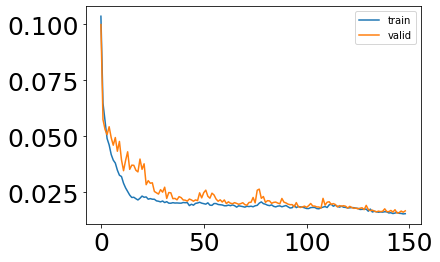

In [93]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='valid')
plt.legend()
plt.show()

In [94]:
import numpy as np
import math
from sklearn.metrics import mean_squared_error

# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], window_size*test_X.shape[2]))
test_X[:,1:]
# # invert scaling for forecast
inv_yhat = np.concatenate((yhat, test_X[:, 1:7]), axis=1)
inv_yhat
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

test_y
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = np.concatenate((test_y, test_X[:, 1:7]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = math.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 3.493


# Result EDA

In [95]:
r=np.concatenate((yhat, test_X[:, 1:7]), axis=1)
r=scaler.inverse_transform(r)
r=pd.DataFrame(r)

In [96]:
len(r[0])

744

In [97]:
def plot_series(time, series, format="-",start=0,end=None):
    plt.plot(time[start:end],series[start:end],format)
    plt.xlabel("Time")
    plt.ylabel("meter reading")
    plt.grid(True)

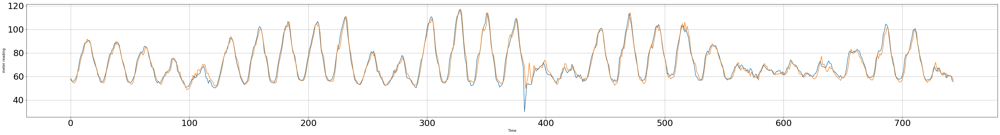

In [98]:
import matplotlib.pyplot as plt
series = inv_y
time_step=[]
for x in range(len(series)):
    time_step.append(x)
time=np.array(time_step)
plt.figure(figsize=(50, 6))
plot_series(time,series)
plot_series(time,r[0])